In [171]:
# Let's import libraries
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score

import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

pio.templates.default = "plotly_dark"
matplotlib.style.use('dark_background')

In [172]:
# Let's import the uber trip data
# We decide to choose the dataset from july.14
data_july = pd.read_csv("src/uber-raw-data-jul14.csv")
data_taxi = pd.read_csv("src/taxi-zone-lookup.csv")

### *EDA* ###

In [173]:
# Basic statistics Jul14 :
print("Number of rows : {}".format(data_july.shape[0]))
print()

print("Overview of the dataset : ")
display(data_july.head())
print()

print("Basic statistics : ")
data_desc = data_july.describe(include='all')
display(data_desc)
print()

print("Percentage of missing values : ")
display(100*data_july.isnull().sum()/data_july.shape[0])

Number of rows : 796121

Overview of the dataset : 


,Date/Time,Lat,Lon,Base
0,7/1/2014 0:03:00,40.7586,-73.9706,B02512
1,7/1/2014 0:05:00,40.7605,-73.9994,B02512
2,7/1/2014 0:06:00,40.7320,-73.9999,B02512
3,7/1/2014 0:09:00,40.7635,-73.9793,B02512
4,7/1/2014 0:20:00,40.7204,-74.0047,B02512



Basic statistics : 


,Date/Time,Lat,Lon,Base
count,796121,796121.000000,796121.000000,796121
unique,44286,NaN,NaN,5
top,7/15/2014 19:30:00,NaN,NaN,B02617
freq,79,NaN,NaN,310160
mean,NaN,40.739141,-73.972353,NaN
std,NaN,0.040551,0.058660,NaN
min,NaN,39.721400,-74.826000,NaN
25%,NaN,40.720900,-73.996100,NaN
50%,NaN,40.742500,-73.983200,NaN
75%,NaN,40.760800,-73.965100,NaN



Percentage of missing values : 


Date/Time    0.0
Lat          0.0
Lon          0.0
Base         0.0
dtype: float64

In [174]:
# Basic statistics Taxi Zone :
print("Number of rows : {}".format(data_taxi.shape[0]))
print()

print("Overview of the dataset : ")
display(data_taxi.head())
print()

print("Basic statistics : ")
data_desc = data_taxi.describe(include='all')
display(data_desc)
print()

print("Percentage of missing values : ")
display(100*data_taxi.isnull().sum()/data_taxi.shape[0])

Number of rows : 265

Overview of the dataset : 


,LocationID,Borough,Zone
0,1,EWR,Newark Airport
1,2,Queens,Jamaica Bay
2,3,Bronx,Allerton/Pelham Gardens
3,4,Manhattan,Alphabet City
4,5,Staten Island,Arden Heights



Basic statistics : 


,LocationID,Borough,Zone
count,265.000000,265,265
unique,NaN,7,261
top,NaN,Queens,Governor's Island/Ellis Island/Liberty Island
freq,NaN,69,3
mean,133.000000,NaN,NaN
std,76.643112,NaN,NaN
min,1.000000,NaN,NaN
25%,67.000000,NaN,NaN
50%,133.000000,NaN,NaN
75%,199.000000,NaN,NaN



Percentage of missing values : 


LocationID    0.0
Borough       0.0
Zone          0.0
dtype: float64

In [175]:
# Let's split the column Date/Time into multiple columns Hour, Dayn Day_of_week and Month
data_july["Date/Time"] =  pd.to_datetime(data_july["Date/Time"], format='%m/%d/%Y %H:%M:%S').round('60min')
data_july["Hour"] = data_july["Date/Time"].dt.hour
data_july["Day"] = data_july["Date/Time"].dt.day
data_july["Day_of_week"] = data_july["Date/Time"].dt.dayofweek
data_july["Month"] = data_july["Date/Time"].dt.month

In [176]:
# Let's drop the column Date/Time
data_july = data_july.drop(["Date/Time"], axis=1)

In [177]:
data_july.head()

,Lat,Lon,Base,Hour,Day,Day_of_week,Month
0,40.7586,-73.9706,B02512,0,1,1,7
1,40.7605,-73.9994,B02512,0,1,1,7
2,40.7320,-73.9999,B02512,0,1,1,7
3,40.7635,-73.9793,B02512,0,1,1,7
4,40.7204,-74.0047,B02512,0,1,1,7


In [178]:
# Let's see how many days we have in dataset
days_of_week = data_july.groupby("Day_of_week").nunique()
print(days_of_week)

              Lat   Lon  Base  Hour  Day  Month
Day_of_week                                    
0            3016  3273     5    24    4      1
1            3178  3608     5    24    5      1
2            3288  3689     5    24    5      1
3            3331  3828     5    24    5      1
4            3168  3710     5    24    5      2
5            3402  3885     5    24    4      1
6            3183  3569     5    24    4      1


In [179]:
data_july.head()

,Lat,Lon,Base,Hour,Day,Day_of_week,Month
0,40.7586,-73.9706,B02512,0,1,1,7
1,40.7605,-73.9994,B02512,0,1,1,7
2,40.7320,-73.9999,B02512,0,1,1,7
3,40.7635,-73.9793,B02512,0,1,1,7
4,40.7204,-74.0047,B02512,0,1,1,7


In [180]:
# Sample
july = data_july.sample(30000)
july

,Lat,Lon,Base,Hour,Day,Day_of_week,Month
712757,40.7615,-73.9833,B02682,18,20,6,7
779677,40.7312,-73.9595,B02682,0,31,3,7
768613,40.7296,-73.9838,B02682,13,29,1,7
433848,40.7400,-74.0363,B02617,16,18,4,7
778865,40.8110,-73.9524,B02682,21,30,2,7
...,...,...,...,...,...,...,...
692108,40.7683,-73.8622,B02682,17,17,3,7
119474,40.6312,-74.0280,B02598,22,12,5,7
241948,40.7403,-74.0053,B02598,9,27,6,7
178974,40.9134,-73.1186,B02598,19,19,5,7


In [181]:
# Let's do some visualisations of the pickups
fig = px.scatter_mapbox(july, 
                        lat = 'Lat', 
                        lon = 'Lon', 
                        mapbox_style = 'carto-positron',
                        color = 'Day_of_week',  
                        zoom=4.5)
fig.show()

print("We are located in new york")

We are located in new york


e:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



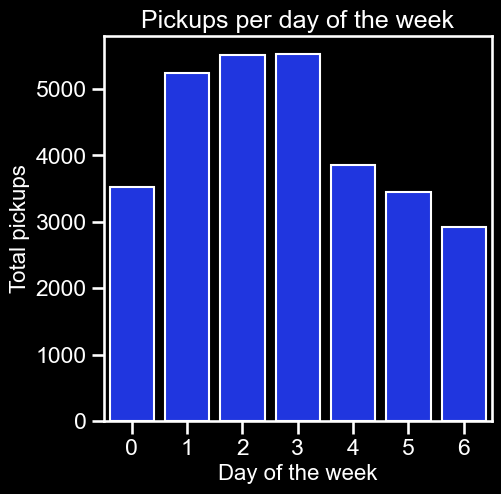

There is more pickups at the mid of the week


In [182]:
# Bar plot per weekday

weekday = july["Base"].groupby(july["Day_of_week"]).count()

plt.figure(figsize=(5,5))
sns.barplot(weekday.index, weekday.values, color="#001eff")
sns.set(style="ticks", context="talk")
plt.style.use("dark_background")
plt.title("Pickups per day of the week", fontsize=18)
plt.ylabel("Total pickups", fontsize=16)
plt.xlabel("Day of the week", fontsize=16)
plt.show()

print("There is more pickups at the mid of the week")

e:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



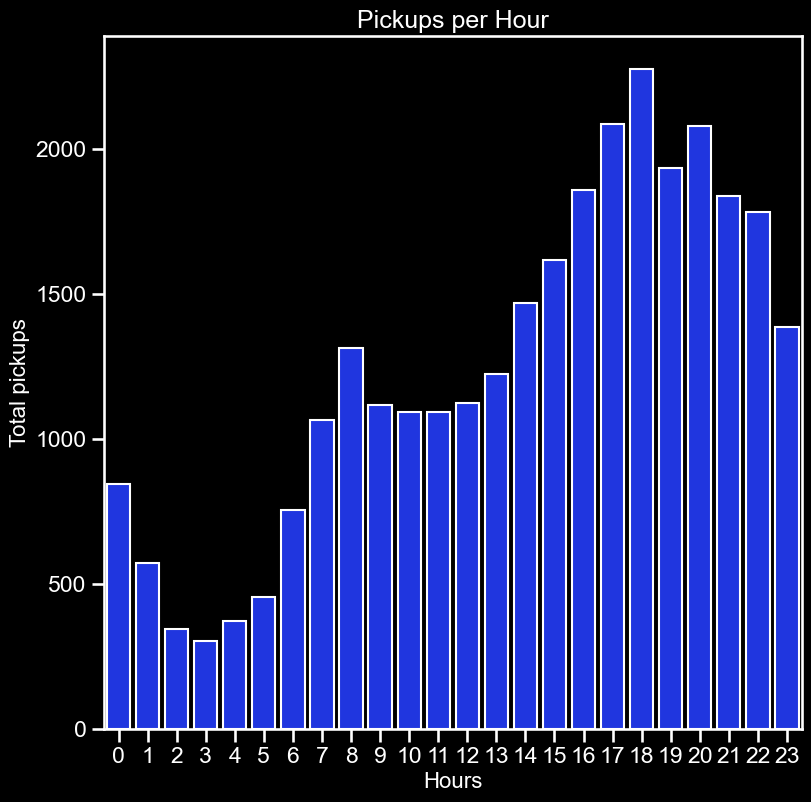

From 5pm to 10pm, we can see a massive uber activity. There is more pickups at 6pm (the peak hour)


In [183]:
# Bar plot per Hour

Hours_day = july["Base"].groupby(july["Hour"]).count()

plt.figure(figsize=(9,9))
sns.barplot(Hours_day.index, Hours_day.values, color="#001eff")
sns.set(style="ticks", context="talk")
plt.style.use("dark_background")
plt.title("Pickups per Hour", fontsize=18)
plt.ylabel("Total pickups", fontsize=16)
plt.xlabel("Hours", fontsize=16)
plt.show()

print("From 5pm to 10pm, we can see a massive uber activity. There is more pickups at 6pm (the peak hour)")

*MODELISATION*

We are going to use KMeans then DBSCAN to lead our Unsupervised Machine Learning project.

### *KMEANS with the gps features "Lat" and "Lon"* ###

In [184]:
july = july.drop(["Base"], axis=1)

In [185]:
july.head()

,Lat,Lon,Hour,Day,Day_of_week,Month
712757,40.7615,-73.9833,18,20,6,7
779677,40.7312,-73.9595,0,31,3,7
768613,40.7296,-73.9838,13,29,1,7
433848,40.7400,-74.0363,16,18,4,7
778865,40.8110,-73.9524,21,30,2,7


In [186]:
# Normalize dataset
# Initialize StandardScaler
# StandardScaler will substract mean and divide by standard deviation to each observation
X = july
sc = StandardScaler()

# Apply StandardScaler to X
X = sc.fit_transform(X.loc[:,['Lat','Lon']])

# Visualize first five rows 
# Standard scaler transform X as numpy array. Therefore you can't use .head()
X[:5]

array([[ 0.54529027, -0.19778434],
       [-0.19453884,  0.20679954],
       [-0.23360572, -0.20628401],
       [ 0.02032902, -1.09874846],
       [ 1.75392197,  0.32749473]])

In [187]:
K = []
WCSS = []
for i in range(2,10):
    kmeans = KMeans(n_clusters=i,random_state=0)
    kmeans.fit(X)
    WCSS.append(kmeans.inertia_)
    K.append(i)
px.line(x=K,y=WCSS)

In [188]:
# Instanciate KMeans with k=3 and initialisation with k-means++
# You should always use k-means++ as it alleviate the problem of local minimum convergence 
kmeans = KMeans(n_clusters=3, random_state=0)

# Fit kmeans to our dataset
kmeans.fit(X)

KMeans(n_clusters=3, random_state=0)

In [189]:
# Select KK optimal clusters
# Let's try the Elbow method 

In [190]:
# Let's create a loop that will collect the Within-sum-of-square (wcss) for each value K 
# Let's use .inertia_ parameter to get the within sum of square value for each value K 
wcss =  []
k = []
for i in range (1,11): 
    kmeans = KMeans(n_clusters= i, random_state = 0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print("WCSS for K={} --> {}".format(i, wcss[-1]))

WCSS for K=1 --> 59999.99999999996
WCSS for K=2 --> 41830.1338045428
WCSS for K=3 --> 29380.177994786332
WCSS for K=4 --> 24023.462413340094
WCSS for K=5 --> 20329.954294023948
WCSS for K=6 --> 16909.191777662207
WCSS for K=7 --> 14200.1338110207
WCSS for K=8 --> 12288.562902412661
WCSS for K=9 --> 10685.955403182457
WCSS for K=10 --> 9415.029452390225


In [191]:
# Let's visualize using plotly
import plotly.express as px

# Create DataFrame
wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)

# Create figure
fig=px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1],
    template="plotly_dark",
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster",
)


fig.show() 

In [192]:
# Let's try the Silhouette method
# Computer mean silhouette score
sil = []
k = []

## Careful, you need to start at i=2 as silhouette score cannot accept less than 2 labels 
for i in range (2,11): 
    kmeans = KMeans(n_clusters= i, random_state = 0)
    kmeans.fit(X)
    sil.append(silhouette_score(X, kmeans.predict(X)))
    k.append(i)
    print("Silhouette score for K={} is {}".format(i, sil[-1]))

Silhouette score for K=2 is 0.7144583569334132
Silhouette score for K=3 is 0.406956480408899
Silhouette score for K=4 is 0.4274458962485939
Silhouette score for K=5 is 0.4421666076833907
Silhouette score for K=6 is 0.4448460093244017
Silhouette score for K=7 is 0.450760504504473
Silhouette score for K=8 is 0.4618939391958773
Silhouette score for K=9 is 0.4377451436979013
Silhouette score for K=10 is 0.4680612710597714


In [193]:
# Let's now visualize each score using Plotly
# Create a data frame 
cluster_scores=pd.DataFrame(sil)
k_frame = pd.Series(k)

# Create figure
fig = px.bar(data_frame=cluster_scores,  
             x=k, 
             y=cluster_scores.iloc[:, -1],
             template="plotly_dark"
            )

# Add title and axis labels
fig.update_layout(
    yaxis_title="Silhouette Score",
    xaxis_title="# Clusters",
    title="Silhouette Score per cluster"
)


fig.show()

Next, we will take $K=3$ clusters. Apply the KMeans to your dataset.

In [194]:
# Let's fit n a KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters= 3)
kmeans.fit(X)

KMeans(n_clusters=3)

In [195]:
july.loc[:,'Cluster_KMeans'] = kmeans.predict(X)
july.head()

,Lat,Lon,Hour,Day,Day_of_week,Month,Cluster_KMeans
712757,40.7615,-73.9833,18,20,6,7,0
779677,40.7312,-73.9595,0,31,3,7,2
768613,40.7296,-73.9838,13,29,1,7,2
433848,40.7400,-74.0363,16,18,4,7,2
778865,40.8110,-73.9524,21,30,2,7,0


In [196]:
# Now let's do a map that allow us to see the pickups depending of clusters on the map
fig = px.scatter_mapbox(july, 
                        lat = "Lat", 
                        lon = "Lon", 
                        mapbox_style = "carto-positron",
                        color = "Cluster_KMeans",  
                        zoom=4.5)
fig.show()

Way to many outliers, we can have a better repartition of the uber pickups.

DBSCAN time now!

### *DBSCAN with the gps features "Lat" and "Lon"* ###

In [197]:
# Let's check out how DBSCAN performs on this uber-raw-data-jul14 dataset.
# Instanciate DBSCAN 
db = DBSCAN(eps=0.1, min_samples=200, metric="manhattan", algorithm="brute")

# Fit on data 
## No need to normalize data, it already is! 
db.fit(X)

DBSCAN(algorithm='brute', eps=0.1, metric='manhattan', min_samples=200)

In [198]:
# Find out how many clusters DBSCAN created.
np.unique(db.labels_)

array([-1,  0,  1,  2,  3,  4], dtype=int64)

In [199]:
# 1- is an outlier

In [200]:
# We add a new column "DBSCAN_Cluster" to our data july where each observations are going to be the label of the corresponding cluster
july["Cluster_DBSCAN"] = db.labels_
july.head()

,Lat,Lon,Hour,Day,Day_of_week,Month,Cluster_KMeans,Cluster_DBSCAN
712757,40.7615,-73.9833,18,20,6,7,0,0
779677,40.7312,-73.9595,0,31,3,7,2,-1
768613,40.7296,-73.9838,13,29,1,7,2,0
433848,40.7400,-74.0363,16,18,4,7,2,-1
778865,40.8110,-73.9524,21,30,2,7,0,-1


In [201]:
db.components_

array([[ 0.54529027, -0.19778434],
       [-0.23360572, -0.20628401],
       [ 0.41099786, -0.02779112],
       ...,
       [-0.46312366, -0.28618082],
       [ 0.03986246, -0.57516931],
       [ 0.02765406, -0.57176945]])

In [202]:
# Let's visualize all the clusters on a map except all the ones that DBSCAN considered as outliers
fig = px.scatter_mapbox(
        july[july["Cluster_DBSCAN"] != -1], 
        lat="Lat", 
        lon="Lon",
        color="Cluster_DBSCAN",
        mapbox_style="carto-positron"
)

fig.show()

In [203]:
# Let's visualize these clusters on the map hour per hour
fig = px.scatter_mapbox(
        july[july["Cluster_DBSCAN"] != -1], 
        lat="Lat", 
        lon="Lon",
        animation_frame="Hour",
        color="Cluster_DBSCAN",
        mapbox_style="carto-positron"
)

fig.show()

In [204]:
# Let's visualize all the clusters on a map day per day
fig = px.scatter_mapbox(
        july[july["Cluster_DBSCAN"] != -1], 
        lat="Lat", 
        lon="Lon",
        animation_frame="Day_of_week",
        color="Cluster_DBSCAN",
        mapbox_style="carto-positron"
)

fig.show()

### *HOT SPOTS* ###

In [205]:
# for each db.labels_ value, create a dictionary with the corresponding cluster centroid longitude and latitude
centroid_dict = {i: [july[july["Cluster_DBSCAN"] == i]["Lon"].mean(), july[july["Cluster_DBSCAN"] == i]["Lat"].mean()] for i in july["Cluster_DBSCAN"].unique()}
# create two columns latitude and longitude for the corresponding cluster centroid
july["Cluster_DBSCAN_Lat"] = july["Cluster_DBSCAN"].map(lambda x: centroid_dict[x][1])
july["Cluster_DBSCAN_Lon"] = july["Cluster_DBSCAN"].map(lambda x: centroid_dict[x][0])

In [206]:
# Map of clusters centroids per Day of week
fig = px.scatter_mapbox(july[july["Cluster_DBSCAN"] != -1], lat="Cluster_DBSCAN_Lat", lon="Cluster_DBSCAN_Lon", color="Cluster_DBSCAN", zoom=8, mapbox_style="carto-positron", animation_frame="Day_of_week", category_orders={"Hour": range(24)}, height=500, width=800)
fig.show()

In [207]:
# Map of clusters centroids per Hour
fig = px.scatter_mapbox(july[july["Cluster_DBSCAN"] != -1], lat="Cluster_DBSCAN_Lat", lon="Cluster_DBSCAN_Lon", color="Cluster_DBSCAN", zoom=8, mapbox_style="carto-positron", animation_frame="Hour", category_orders={"Hour": range(24)}, height=500, width=800)
fig.show()

We got a a much clearer distribution with DBSCAN by using the two gps features


Hot spots are located at : 
- 250 5th Ave, New York, NY 10001, États-Unis (at Manhattan) (40.74494° N, 73.9876° W)
- N 8th St, Brooklyn, NY 11249, États-Unis (40.71913°N , 73.95852°W )
- 100 LaGuardia Rd, Queens, NY 11371, États-Unis (40.7738° N, 73.87206° W)
- Terminal C, 1 Terminal C Departures Inner Rd, Queens, NY 11371, États-Unis (40.76944° N, 73.86402° W)
- John F. Kennedy International Airport (40.64535° N, 73.78363° W)

### *Conclusion* ###

- We can't see a proper distribution with KMeans by using the 2 features "Lat" & "Lon". Too many outliers.
- We can see a better distribution with DBSCAN by using the 2 GPS features "Lat" and "Lon"